In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("bigmarttrain.csv")
pd.set_option('display.max_rows',None)

In [3]:
df

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052
5,FDP36,10.395,Regular,0.000000,Baking Goods,51.4008,OUT018,2009,Medium,Tier 3,Supermarket Type2,556.6088
6,FDO10,13.650,Regular,0.012741,Snack Foods,57.6588,OUT013,1987,High,Tier 3,Supermarket Type1,343.5528
7,FDP10,NaN,Low Fat,0.127470,Snack Foods,107.7622,OUT027,1985,Medium,Tier 3,Supermarket Type3,4022.7636
8,FDH17,16.200,Regular,0.016687,Frozen Foods,96.9726,OUT045,2002,NaN,Tier 2,Supermarket Type1,1076.5986
9,FDU28,19.200,Regular,0.094450,Frozen Foods,187.8214,OUT017,2007,NaN,Tier 2,Supermarket Type1,4710.5350


In [4]:
df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
dtype: object

In [5]:
df.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

<AxesSubplot:>

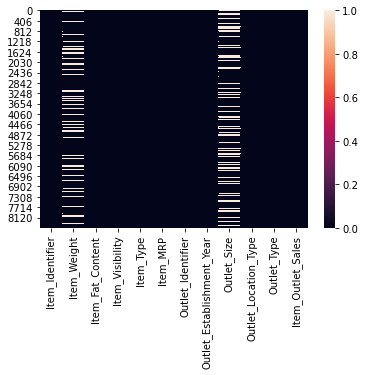

In [6]:
sns.heatmap(df.isnull())

In [7]:
df['Item_Weight'].isnull().sum()

1463

filling the nan values of item wieght column with mean of the data using fillna method

In [8]:
df['Item_Weight']=(df['Item_Weight'].fillna(df['Item_Weight'].mean()))

as there are a lot of null values in outlet size so we are removing the column

In [9]:
df.drop("Outlet_Size",axis=1,inplace=True)

<AxesSubplot:>

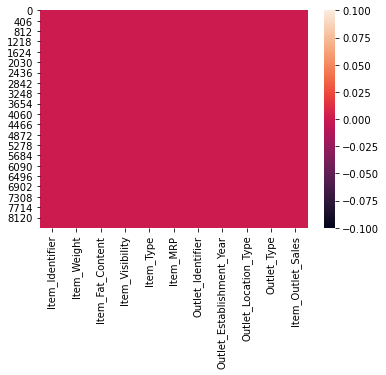

In [10]:
sns.heatmap(df.isnull())

<AxesSubplot:xlabel='Outlet_Establishment_Year', ylabel='count'>

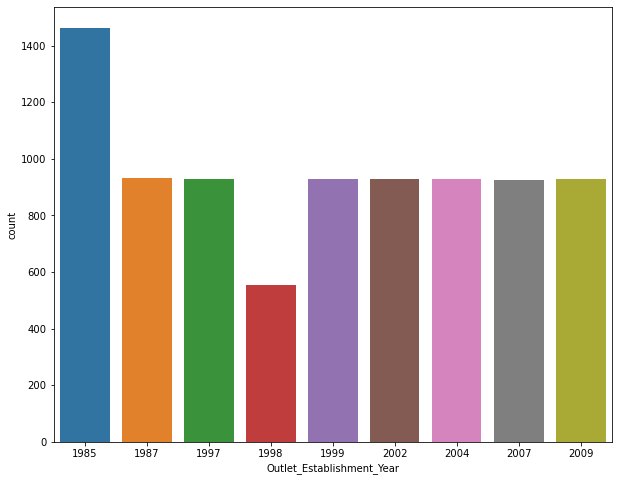

In [11]:
plt.figure(figsize=(10,8))
sns.countplot(df['Outlet_Establishment_Year'])

<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

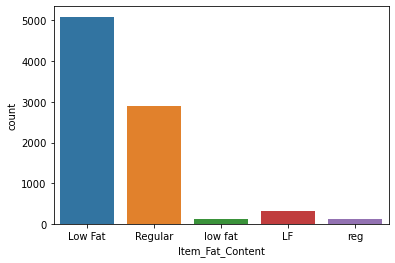

In [12]:
sns.countplot('Item_Fat_Content',data=df)

as we can see there shoulf be only 2 categories low fat and regular but there are 5 , so making it into 2 features


In [13]:
df['Item_Fat_Content'].value_counts()

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

In [14]:
df.replace({'Item_Fat_Content':{'low fat':'Low Fat','LF':'Low Fat','reg':'Regular'}})
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,Tier 3,Supermarket Type1,994.7052


<AxesSubplot:xlabel='Outlet_Type', ylabel='count'>

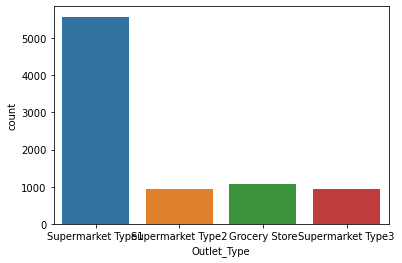

In [15]:
sns.countplot('Outlet_Type',data=df)

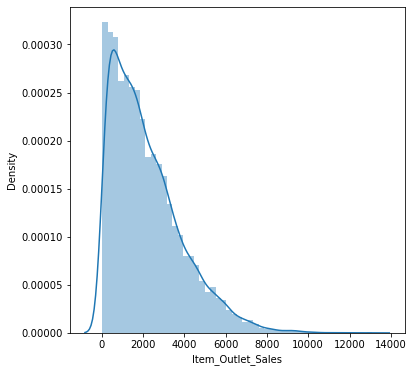

In [16]:
plt.figure(figsize=(6,6))
sns.distplot(df['Item_Outlet_Sales'])
plt.show()

<AxesSubplot:xlabel='Item_MRP', ylabel='Density'>

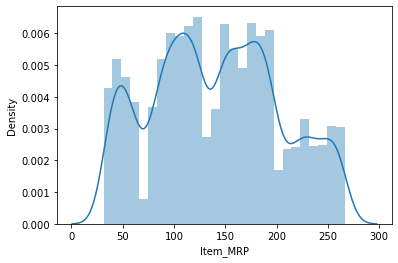

In [17]:
sns.distplot(df['Item_MRP'])

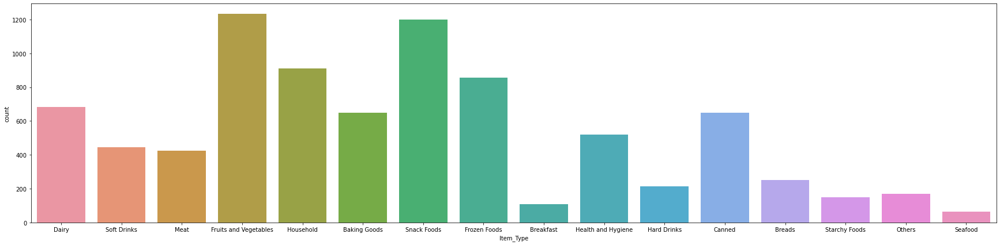

In [18]:
plt.figure(figsize=(30,7))
sns.countplot(x="Item_Type",data=df)
plt.show()

In [19]:
df.head(5)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,Tier 3,Supermarket Type1,994.7052


In [20]:
from sklearn.preprocessing import LabelEncoder

In [21]:
le=LabelEncoder()
list1=['Item_Fat_Content',"Outlet_Location_Type","Outlet_Type","Item_Identifier","Item_Type","Outlet_Identifier"]
for val in list1:
    df[val]=le.fit_transform(df[val])

In [22]:
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,156,9.30,1,0.016047,4,249.8092,9,1999,0,1,3735.1380
1,8,5.92,2,0.019278,14,48.2692,3,2009,2,2,443.4228
2,662,17.50,1,0.016760,10,141.6180,9,1999,0,1,2097.2700
3,1121,19.20,2,0.000000,6,182.0950,0,1998,2,0,732.3800
4,1297,8.93,1,0.000000,9,53.8614,1,1987,2,1,994.7052


In [23]:
df.describe()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
count,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,779.714889,12.857645,1.369354,0.066132,7.226681,140.992782,4.722281,1997.831867,1.112871,1.201220,2181.288914
std,449.222377,4.226124,0.644810,0.051598,4.209990,62.275067,2.837201,8.371760,0.812757,0.796459,1706.499616
min,0.000000,4.555000,0.000000,0.000000,0.000000,31.290000,0.000000,1985.000000,0.000000,0.000000,33.290000
25%,395.500000,9.310000,1.000000,0.026989,4.000000,93.826500,2.000000,1987.000000,0.000000,1.000000,834.247400
50%,783.000000,12.857645,1.000000,0.053931,6.000000,143.012800,5.000000,1999.000000,1.000000,1.000000,1794.331000
75%,1167.000000,16.000000,2.000000,0.094585,10.000000,185.643700,7.000000,2004.000000,2.000000,1.000000,3101.296400
max,1558.000000,21.350000,4.000000,0.328391,15.000000,266.888400,9.000000,2009.000000,2.000000,3.000000,13086.964800


In [24]:
from sklearn.preprocessing import StandardScaler

In [25]:
from sklearn.model_selection import train_test_split

In [26]:
x=df.iloc[:,:-1]
x.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Location_Type,Outlet_Type
0,156,9.30,1,0.016047,4,249.8092,9,1999,0,1
1,8,5.92,2,0.019278,14,48.2692,3,2009,2,2
2,662,17.50,1,0.016760,10,141.6180,9,1999,0,1
3,1121,19.20,2,0.000000,6,182.0950,0,1998,2,0
4,1297,8.93,1,0.000000,9,53.8614,1,1987,2,1


In [27]:
y=df.iloc[:,-1]

In [28]:
y

0        3735.1380
1         443.4228
2        2097.2700
3         732.3800
4         994.7052
5         556.6088
6         343.5528
7        4022.7636
8        1076.5986
9        4710.5350
10       1516.0266
11       2187.1530
12       1589.2646
13       2145.2076
14       1977.4260
15       1547.3192
16       1621.8888
17        718.3982
18       2303.6680
19       2748.4224
20       3775.0860
21       4064.0432
22       1587.2672
23        214.3876
24       4078.0250
25        838.9080
26       1065.2800
27        308.9312
28        178.4344
29        125.8362
30        163.7868
31       2741.7644
32       3068.0064
33       2174.5028
34       2085.2856
35       3791.0652
36       2797.6916
37       1609.9044
38        388.1614
39       2180.4950
40       3435.5280
41       2150.5340
42       2527.3768
43       6768.5228
44        373.5138
45        358.2004
46       2428.8384
47       5815.0972
48       2576.6460
49        780.3176
50       3134.5864
51        850.8924
52        81

now transforming the data to remove the skewness

In [29]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=2)


In [30]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
sc.fit(x)
x

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Location_Type,Outlet_Type
0,156,9.300000,1,0.016047,4,249.8092,9,1999,0,1
1,8,5.920000,2,0.019278,14,48.2692,3,2009,2,2
2,662,17.500000,1,0.016760,10,141.6180,9,1999,0,1
3,1121,19.200000,2,0.000000,6,182.0950,0,1998,2,0
4,1297,8.930000,1,0.000000,9,53.8614,1,1987,2,1
5,758,10.395000,2,0.000000,0,51.4008,3,2009,2,2
6,696,13.650000,2,0.012741,13,57.6588,1,1987,2,1
7,738,12.857645,1,0.127470,13,107.7622,5,1985,2,3
8,440,16.200000,2,0.016687,5,96.9726,7,2002,1,1
9,990,19.200000,2,0.094450,5,187.8214,2,2007,1,1


In [31]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import r2_score

In [32]:
lr=LinearRegression()
lr.fit(x_train,y_train)
train_predlr=lr.predict(x_train)
test_predlr=lr.predict(x_test)




In [33]:
r2_train=r2_score(y_train,train_predlr)

In [34]:
r2_train

0.5056889466802494

In [35]:
r2_test=r2_score(y_test,test_predlr)

In [36]:
r2_test

0.48662340967423867

In [37]:
from sklearn.linear_model import Lasso,Ridge

In [38]:
ls=Lasso(alpha=0.0001)
ls.fit(x_train,y_train)
ls.score(x_train,y_train)





0.5056889466788206

In [39]:
rd=Ridge(alpha=0.0001)
rd.fit(x_train,y_train)
rd.score(x_train,y_train)


0.5056889466801724

checking cross validation

In [45]:
pred_test=lr.predict(x_test)
pred_train=lr.predict(x_train)



In [46]:
print(r2_score(y_test,pred_test))

0.48662340967423867


In [47]:
train_accuracy=r2_score(y_train,pred_train)
test_accuracy=r2_score(y_test,pred_test)


In [48]:
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,x,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"at cross fold {j} the cv score is {cv_mean} and accuracy score for training is{train_accuracy} and accuracy for the testing is{test_accuracy}")
print("/n")

at cross fold 2 the cv score is 0.4995575889515887 and accuracy score for training is0.5056889466802494 and accuracy for the testing is0.48662340967423867
at cross fold 3 the cv score is 0.4999392657493928 and accuracy score for training is0.5056889466802494 and accuracy for the testing is0.48662340967423867
at cross fold 4 the cv score is 0.4990450969742075 and accuracy score for training is0.5056889466802494 and accuracy for the testing is0.48662340967423867
at cross fold 5 the cv score is 0.49997588091398226 and accuracy score for training is0.5056889466802494 and accuracy for the testing is0.48662340967423867
at cross fold 6 the cv score is 0.4994530600704528 and accuracy score for training is0.5056889466802494 and accuracy for the testing is0.48662340967423867
at cross fold 7 the cv score is 0.5004391607013211 and accuracy score for training is0.5056889466802494 and accuracy for the testing is0.48662340967423867
at cross fold 8 the cv score is 0.49976117366283324 and accuracy scor